# Social Network Analysis

**Note**: Some of the graphs may not show here. You might have to download and run the code to see them.

## Installing and Importing Libraries

In [3]:
! pip install networkx
! pip install plotly
! pip install colorlover
! pip install nltk

In [4]:
import networkx as nx
import pandas as pd
import io
from google.colab import files
from matplotlib import pyplot as plt

import operator

import numpy as np

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.graph_objs import *
import plotly.graph_objects as go
init_notebook_mode(connected=True)

import colorlover as cl
from IPython.display import HTML

from collections import Counter
import nltk
nltk.download("stopwords")
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [0]:
df = pd.read_csv("tweets2009-06-0115.csv.zip", sep='\t', compression='zip') #dataset included on the github repo

## Choosing a Hashtag from the tweets file to analyze

Hashtag selected- #vampirebite (2634 mentions).

In [0]:
hashTagDf = df[df["tweet"].str.lower().str.contains("#vampirebite", na=False)].copy()

In [0]:
def addMentionedColumn(df):
    
    def mentionsList(txt):
        allWords = [word.strip(""" ,.:'\";""").lower() for word in txt.split()]
        allNames = [word.strip("@") for word in allWords if word.startswith("@")]
        uniqueNames = list(set(allNames))
        return allNames
    
    df["mentioned"] = df["tweet"].apply(mentionsList)

In [0]:
addMentionedColumn(hashTagDf)

In [9]:
hashTagDf.head(10)

,date,user,tweet,mentioned
3246,2009-06-11 17:03:03,lilmel101,☥ @VmpTw is now my Tasty Prey - Bite Me ➡ http...,[vmptw]
4691,2009-06-11 17:06:50,noctem77,"☥ @Jordansfavorite, @skyareblue, @Sajo76 are n...","[jordansfavorite, skyareblue, sajo76]"
5304,2009-06-11 17:07:19,luluchandie85,"☥ @DarkLeto, @jaredleto, @Denalie, @chantaleto...","[darkleto, jaredleto, denalie, chantaleto, pie..."
6535,2009-06-11 17:08:52,mari_nne,"☥ @ceciliaa_, @karineribeiro, @Dehg, @babi_vie...","[ceciliaa_, karineribeiro, dehg, babi_vieira, ..."
6730,2009-06-11 17:09:02,jujub7,"☥ @AngelsandDevils, @bjfabian11, @joshuaarnao,...","[angelsanddevils, bjfabian11, joshuaarnao, att..."
6878,2009-06-11 17:09:11,ginaluvsga,"☥ @legacy62, @twilightpoison, @RobPattzNews, @...","[legacy62, twilightpoison, robpattznews, bl828..."
6919,2009-06-11 17:09:12,ginaluvsga,"☥ @peterfacinelli, @wdwdisneyland, @teachmeple...","[peterfacinelli, wdwdisneyland, teachmeplease,..."
7138,2009-06-11 17:09:37,noctem77,"☥ @JKLady, @mexican_girl, @DonnieandI are now ...","[jklady, mexican_girl, donnieandi]"
8405,2009-06-11 17:11:00,ilvjaspercullen,"☥ @thatzak, @wtcc, @swiftkaratechop, @EdCullen...","[thatzak, wtcc, swiftkaratechop, edcullen, scy..."
8744,2009-06-11 17:11:15,ilvjaspercullen,☥ @charlieskies is now my Tasty Prey - Bite Me...,[charlieskies]


In [0]:
#hashTag.to_csv('hashtag_df')

## Building a Mention Graph

In [0]:
def mentionGraph(df):
    g = nx.Graph()
    
    for (index, date, user, tweet, mentionedUsers) in df.itertuples():
        for mentionedUser in mentionedUsers:
            if (user in g) and (mentionedUser in g[user]):
                g[user][mentionedUser]["numberMentions"] += 1
            else:
                g.add_edge(user, mentionedUser, numberMentions=1)
    
    return g

In [0]:
hashTagGraph = mentionGraph(hashTagDf)

In [13]:
print("# nodes in the mention graph:", len(hashTagGraph.nodes()))
print("# edges in the mention graph:", len(hashTagGraph.edges()))

# nodes in the mention graph: 4828
# edges in the mention graph: 5492


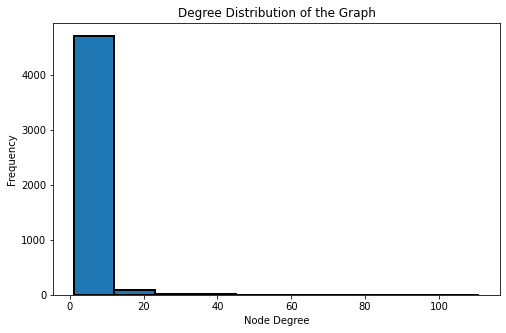

In [14]:
values= [v for k, v in nx.degree(hashTagGraph)]
plt.figure(figsize=(8,5))
plt.hist(values, linewidth= 2, edgecolor= 'black')
plt.title('Degree Distribution of the Graph')
plt.xlabel('Node Degree')
plt.ylabel('Frequency')
plt.show()

Histogram is skewed towards the right which indicates that the majority of the nodes have a low degree.
This is a result of very few users mentioning the same account a lot of times. This also indicates that the graph might not be very well connected.

### Edge weights

In [0]:
def EdgeWeights(Graph):
  """"Returns the top edges in terms of the weight (mentions)"""

  edge_weights= []
  for node1, node2 in Graph.edges():
    edge_weights.append([node1, node2, Graph[node1][node2]['numberMentions']])
  
  df_edges= pd.DataFrame(edge_weights)
  df_edges.columns= ["node1", "node2", "Weight"]
  df_edges= df_edges.sort_values('Weight',ascending=0)

  return df_edges

In [16]:
EdgeWeights(hashTagGraph).head(5)

,node1,node2,Weight
590,andreaaab,peanut124,7
3494,rossoneriblog,hank03ma,5
3382,maximiliana,rossoneriblog,5
1889,oxyg,deadlygadget,4
447,ashthebeliever,_annet,4


### Visualization of mention graph

In [17]:
# map PuRd color scale to 7 cells
purd = cl.scales['6']['seq']['PuRd']
purd7 = cl.interp(purd, 7)
HTML(cl.to_html(purd7))

In [0]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

Generate random positions for nodes and store them at property "pos"

In [0]:
import random
def addRandomPositions(graph):
    posDict = dict((node,(random.gauss(0,10),random.gauss(0,10))) for node in graph.nodes())
    nx.set_node_attributes(graph, name="pos", values=posDict)

In [0]:
addRandomPositions(hashTagGraph)

In [0]:
def plotEdgeMentionColor(graph):
    
    maxMention = EdgeWeights(graph).Weight.max()
    minMention = EdgeWeights(graph).Weight.min()
    
    scatters=[]

    for (node1, node2) in graph.edges():
        x0, y0 = graph.nodes[node1]['pos']
        x1, y1 = graph.nodes[node2]['pos']
        edgeWidth = graph[node1][node2]['numberMentions']
        edgeColor = int(6*(edgeWidth-minMention)/(maxMention-minMention))
        s = Scatter(
                x=[x0, x1],
                y=[y0, y1],
                hoverinfo='text',
                text="Edge: %s\Weight: %f" % ((node1,node2), edgeWidth),
                mode='lines', 
                line=scatter.Line(width=edgeWidth ,color=purd7[edgeColor]))
        scatters.append(s)

    for node in graph.nodes():
        xPos, yPos = graph.nodes[node]['pos']
        s = Scatter(
                x=[xPos], 
                y=[yPos], 
                hoverinfo='none',
                mode='markers', 
                marker=dict(
                    color="#888", 
#                     size=nx.degree(graph,node)*2,         
                    size=2,
                    line=dict(width=2)))
        scatters.append(s)
    
    layout = Layout(showlegend=False)
    fig = Figure(data=scatters, layout=layout)
    iplot(fig, show_link=False)

In [22]:
configure_plotly_browser_state()
plotEdgeMentionColor(hashTagGraph)

<img src="https://drive.google.com/uc?id=1UdZ4w_ZaC_iuHVnFkmA9KbqVQUJdJCSu">

#### NetworkX Layouts

Note: Spring layout gives no results and Spectral layout does not converge. This could be due to the graph having a high number of nodes and edges.

1.   Random layout
2.   Central layout (does not give a nice layout and hence not included in the notebook)




In [0]:
def applyLayout(graph, layoutFunc):
    posDict = layoutFunc(graph) 
    nx.set_node_attributes(graph, name="pos", values=posDict)

In [38]:
hashTagGraphRandom = hashTagGraph.copy()
applyLayout(hashTagGraphRandom, nx.random_layout)
configure_plotly_browser_state()
plotEdgeMentionColor(hashTagGraphRandom)

<img src="https://drive.google.com/uc?id=13iSj9g7n_loXjP7mzU9pMOYWo3z29fak">

## Content Analysis

### Analyzing most common words

In [0]:
allTweets = hashTagDf["tweet"].str.cat(sep=' ')
words_clean = []
tokenizer = RegexpTokenizer(r'\w+')
s1= ' '
for word in allTweets.split():         
    b = tokenizer.tokenize(word.lower())
    words_rmStop= [word for word in b if word not in stopwords.words('english')] # remove stop words
    words_clean.append(s1.join(words_rmStop))

In [40]:
words_clean = [i for i in words_clean if i] #to remove the empty string 
Counter(words_clean).most_common(100)

[('vampirebite', 2634),
 ('bite', 2622),
 ('tasty', 2621),
 ('prey', 2621),
 ('tommcfly', 96),
 ('http vmp tw gicadiass', 95),
 ('2009 06 13', 93),
 ('dannymcfly', 73),
 ('dougiemcfly', 71),
 ('2009 06 12', 71),
 ('debbiefletcher', 58),
 ('mileycyrus', 55),
 ('http vmp tw lilasouza', 40),
 ('rt', 40),
 ('ddlovato', 38),
 ('mcflyharry', 37),
 ('http vmp tw leobender182', 37),
 ('peterfacinelli', 36),
 ('gfalcone601', 35),
 ('j14magazine', 29),
 ('http vmp tw topeir_a', 28),
 ('vmptw', 27),
 ('http vmp tw jmaurojr', 26),
 ('http vmp tw pinkdany', 24),
 ('jonasbrothers', 24),
 ('18 48 19', 24),
 ('19 14 52', 24),
 ('01 40 01', 22),
 ('19 14 51', 22),
 ('07 05 48', 21),
 ('moiswashere', 21),
 ('littlefletcher', 20),
 ('ninjafanpire', 19),
 ('selenagomez', 17),
 ('http vmp tw ayyallaa', 17),
 ('http vmp tw carolnog', 16),
 ('http vmp tw madhatter1978', 16),
 ('http vmp tw hibia', 16),
 ('http vmp tw noctem77', 15),
 ('http vmp tw bayvendor', 15),
 ('http vmp tw kylasage23', 14),
 ('taylorsw

Basic themes around the chosen hashtag as expected (#vampirebite) is the hashtag itself, biting, prey, and similar words. 
In addition, there is a mention of the band McFly (and its members) which starred in a vampire-themed movie (Nowehere Left to Run). There are mentions of other celebrities too (such as Miley Cyrus and Demi Lovato). This represents the influence of celebrities in major trends.

Also, it is worth noting that Twilight was released at the end of 2018 which could have had a large impact on the "vampire theme".

Reference: https://en.wikipedia.org/wiki/Nowhere_Left_to_Run

### Including the common words in the visualization

In [0]:
def top3commonwords (node):
  allTweets = hashTagDf.loc[hashTagDf.user == node]["tweet"].str.cat(sep=' ')
  words_clean = []
  tokenizer = RegexpTokenizer(r'\w+')
  s1= ' '
  for word in allTweets.split():         
    b = tokenizer.tokenize(word.lower())
    words_rmStop= [word for word in b if word not in stopwords.words('english')] # remove stop words
    words_clean.append(s1.join(words_rmStop))
  
  words_clean = [i for i in words_clean if i] #to remove the empty string 
  top3common= [u for u,v in Counter(words_clean).most_common(3)]
  
  if top3common == []:
    top3common= "N/A"

  return top3common

In [0]:
def plotEdgeMentionColor_commonwords(graph):
    
    maxMention = EdgeWeights(graph).Weight.max()
    minMention = EdgeWeights(graph).Weight.min()
    
    scatters=[]

    for (node1, node2) in graph.edges():
        x0, y0 = graph.nodes[node1]['pos']
        x1, y1 = graph.nodes[node2]['pos']
        edgeWidth = graph[node1][node2]['numberMentions']
        edgeColor = int(6*(edgeWidth-minMention)/(maxMention-minMention))
        s = Scatter(
                x=[x0, x1],
                y=[y0, y1],
                hoverinfo='text',
                text="Edge: %s\Weight: %f" % ((node1,node2), edgeWidth),
                mode='lines', 
                line=scatter.Line(width=edgeWidth ,color=purd7[edgeColor]))
        scatters.append(s)

    for node in graph.nodes():
        common_words= Counter(words_clean).most_common(3)
        xPos, yPos = graph.nodes[node]['pos']
        s = Scatter(
                x=[xPos], 
                y=[yPos], 
                hoverinfo='text',
                text= 'Node: %s,Common word: %s' % (node,top3commonwords(node)),
                textfont={'color' : "#fff"},
                mode='markers', 
                marker=dict(
                    color="#888", 
#                     size=nx.degree(graph,node)*2,         
                    size=2,
                    line=dict(width=2)))
        scatters.append(s)
    
    layout = Layout(showlegend=False)
    fig = Figure(data=scatters, layout=layout)
    iplot(fig, show_link=False)

In [0]:
hashTagGraphRandom = hashTagGraph.copy()
applyLayout(hashTagGraphRandom, nx.random_layout)
configure_plotly_browser_state()
plotEdgeMentionColor_commonwords(hashTagGraphRandom)

Note: N/A represents the users that did not have tweet content and hence no common words.

## Centrality Analysis

Centrality measures initially chosen:
- Degree Centrality
- Page Rank
- Betweenness Centrality

In [0]:
degree_centrality= nx.degree_centrality(hashTagGraph)

In [0]:
betweenness_centrality= nx.betweenness_centrality(hashTagGraph)

In [0]:
page_rank= nx.pagerank(hashTagGraph)

### Visualization of centrality measures

In [47]:
# map purd color scale to 300 cells
purd = cl.scales['9']['seq']['PuRd']
purd300 = cl.interp(purd, 300)
HTML(cl.to_html(purd300))

In [0]:
def plotNetworkSizeColor(graph, centrality):

    maxCentr = max(centrality.values())
    minCentr = min(centrality.values())
    
    scatters=[]

    for (node1, node2) in graph.edges():
        x0, y0 = graph.nodes[node1]['pos']
        x1, y1 = graph.nodes[node2]['pos']
        edgeWidth = graph[node1][node2]['numberMentions']
        s = Scatter(
                x=[x0, x1],
                y=[y0, y1],
                hoverinfo='none',
                mode='lines', 
                line=scatter.Line(width=edgeWidth ,color='#888'))
        scatters.append(s)



    for node in graph.nodes():
        nodeCentr = centrality[node]
        nodeColor = int(299*(nodeCentr-minCentr)/(maxCentr-minCentr))
        xPos, yPos = graph.nodes[node]['pos']
        s = Scatter(
                x=[xPos], 
                y=[yPos], 
                text="User: %s\nCloseness: %.3f" % (node, nodeCentr),
                hoverinfo='text',
                mode='markers', 
                marker=dict(
                    color=purd300[nodeColor], 
                    size=nx.degree(graph,node)*2,         
                    line=dict(width=2)))
        scatters.append(s)
    
    layout = Layout(showlegend=False)
    fig = Figure(data=scatters, layout=layout)
    iplot(fig, show_link=False)

### Degree Centrality

In [0]:
hashTagGraphRandom = hashTagGraph.copy()
applyLayout(hashTagGraphRandom, nx.random_layout)
configure_plotly_browser_state()
plotNetworkSizeColor(hashTagGraphRandom, degree_centrality)

<img src="https://drive.google.com/uc?id=1j5xJw_T0WspwbshBVnpFHQHBZWoVMrom">

### Page Rank

In [0]:
hashTagGraphRandom = hashTagGraph.copy()
applyLayout(hashTagGraphRandom, nx.random_layout)
configure_plotly_browser_state()
plotNetworkSizeColor(hashTagGraphRandom, page_rank)

<img src="https://drive.google.com/uc?id=1aR10lulI-rqJDuxhtqYK18r3an1yZhf1">

### Betweenness Centrality

In [0]:
hashTagGraphRandom = hashTagGraph.copy()
applyLayout(hashTagGraphRandom, nx.random_layout)
configure_plotly_browser_state()
plotNetworkSizeColor(hashTagGraphRandom, betweenness_centrality)

<img src="https://drive.google.com/uc?id=14n50lD5PZrvHTw3sQqJWU61Oy4JLoddW">

### Analyzing key players

In [52]:
# Top 10 by degree centrality
sorted(degree_centrality.items(), key=operator.itemgetter(1), reverse=True)[0:10]

[('jmaurojr', 0.022995649471721568),
 ('gicadiass', 0.019266625233064015),
 ('tommcfly', 0.017816449140252745),
 ('debbiefletcher', 0.014916096954630205),
 ('lilasouza', 0.013880256888336441),
 ('dougiemcfly', 0.013465920861818935),
 ('dannymcfly', 0.01305158483530143),
 ('carolnog', 0.01160140874249016),
 ('ayyallaa', 0.010565568676196395),
 ('hibia', 0.009529728609902631)]

In [53]:
dict(nx.degree(hashTagGraph))
sorted(dict(nx.degree(hashTagGraph)).items(), key=operator.itemgetter(1), reverse=True)[0:10]

[('jmaurojr', 111),
 ('gicadiass', 93),
 ('tommcfly', 86),
 ('debbiefletcher', 72),
 ('lilasouza', 67),
 ('dougiemcfly', 65),
 ('dannymcfly', 63),
 ('carolnog', 56),
 ('ayyallaa', 51),
 ('hibia', 46)]

In [54]:
# Top 10 by Page Rank
sorted(page_rank.items(), key=operator.itemgetter(1), reverse=True)[0:10]

[('jmaurojr', 0.009922209133420614),
 ('gicadiass', 0.007330583053176081),
 ('tommcfly', 0.004908328558762105),
 ('lilasouza', 0.004604398725982277),
 ('debbiefletcher', 0.00441484694608039),
 ('ayyallaa', 0.004136488834400779),
 ('carolnog', 0.003954890116884886),
 ('dougiemcfly', 0.0036327613108138378),
 ('xpanic_dollx', 0.0035627497855124307),
 ('dannymcfly', 0.0034046169747918545)]

In [55]:
# Top 10 by Betweenness Centrality
sorted(betweenness_centrality.items(), key=operator.itemgetter(1), reverse=True)[0:10]

[('gicadiass', 0.08943604679743378),
 ('pinkdany', 0.07712590683538925),
 ('tommcfly', 0.07627850983010923),
 ('mileycyrus', 0.06768693257576235),
 ('carolnog', 0.06760374559922161),
 ('leobender182', 0.052397106625160374),
 ('lilasouza', 0.047209525004057035),
 ('brittnodo', 0.04645813117480966),
 ('ddlovato', 0.04288697681901017),
 ('madhatter1978', 0.041858212394956656)]

The results are similar for the Page Rank and Degree Centrality specially for the top 3. The rest of the users might be in different orders.
This is because there are not too many strongly connected components as noted earlier since there the majority of nodes have the lower degrees (less than 20). Most nodes dont have an in and out degree.

Betweenness centrality measures how important user (node) is to the shortest paths through the network and hence the results are different for these. For example, there are more inclusion of celebrities in this list that was not seen in the other ones (such as mileycyrus and ddlovato)



Degree Centrality and Page Rank are basically giving similar key players as it just considers the nodes with the higher degrees. Even though Page Rank uses more information to determine the importance of a node, in this weakly connected graph, it is unable to provide extra information. 

Betweenness centrality, on the other hand, gives some valuable insights specially with the inclusion of certain celebrities who could be understood to be more important for the hashtag (eg. mileycyrus, tommcfly).

## Connectivity Patterns

1. Number of maximal cliques in your graph.
2. The graph's clique number (size of the largest clique in the graph).
3. Number of maximal cliques for each node
4. Size of the largest maximal clique containing each given node.

In [56]:
print("Number of maximal cliques:", nx.graph_number_of_cliques(hashTagGraph))

Number of maximal cliques: 5224


In [57]:
print("Graph's clique number:", nx.graph_clique_number(hashTagGraph))

Graph's clique number: 3


In [58]:
print("Number of Maximal Cliques for each node: ")
pd.DataFrame(list(nx.number_of_cliques(hashTagGraph).items()), columns= ["Nodes", "Maximal Cliques"]).sort_values("Maximal Cliques", ascending= 0).head(20)

Number of Maximal Cliques for each node: 


,Nodes,Maximal Cliques
527,jmaurojr,110
295,gicadiass,91
76,tommcfly,83
49,debbiefletcher,69
263,lilasouza,62
77,dougiemcfly,62
180,dannymcfly,61
117,carolnog,53
1144,ayyallaa,49
1148,hibia,43


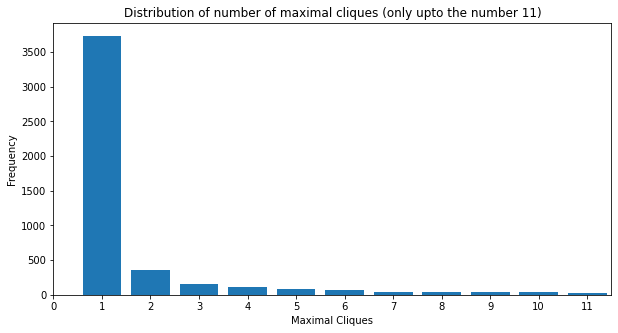

In [59]:
plt.figure(figsize=(10,5))
a= Counter(nx.number_of_cliques(hashTagGraph).values())
plt.bar(a.keys(), a.values())
plt.xlim(0,11.5)
plt.title('Distribution of number of maximal cliques (only upto the number 11)')
plt.ylabel('Frequency')
plt.xlabel('Maximal Cliques')
plt.xticks(range(0,12))
plt.show()

In [60]:
print("Size of the largest maximal clique containing each given node: ")
df_cliquesize= pd.DataFrame(list(nx.node_clique_number(hashTagGraph).items()), columns= ["Nodes", "Maximal Cliques Size"]).sort_values("Maximal Cliques Size", ascending= 0)
df_cliquesize.head(20)

Size of the largest maximal clique containing each given node: 


,Nodes,Maximal Cliques Size
2679,naaywiira,3
3011,naterella,3
180,dannymcfly,3
3517,belinhafletcher,3
1190,anahblk,3
4390,burning_angel,3
2646,stephen3195,3
4389,smiley92,3
4386,jennakeo,3
3206,queer_life,3


In [61]:
Counter(nx.node_clique_number(hashTagGraph).values())

Counter({1: 15, 2: 4572, 3: 241})

In [62]:
df_cliquesize.loc[(df_cliquesize.Nodes == "tommcfly")  | (df_cliquesize.Nodes == "debbiefletcher") | (df_cliquesize.Nodes == 'jmaurojr') |	(df_cliquesize.Nodes == 'gicadiass')]

,Nodes,Maximal Cliques Size
527,jmaurojr,3
295,gicadiass,3
76,tommcfly,3
49,debbiefletcher,3


### Discussion

Final data for #vampirebite:

- nodes: 4828
- edges: 5492
- 3,731 nodes have a maximal clique of 1 (check plot above)
- number of maximal cliques: 5224
  - 241 of those cliques have size 3 (largest size)
  - 4572 have size 2
  - 15 have size 1

jmaurojr,	gicadiass, tommcfly, debbiefletcher have higher number of maximal cliches and hence they are the important ones. The ones with the highest maximal cliches were also found to be in the list for the Centrality Analysis (Q4). 

Most of the cliques have size 2 or lower whereas the highest size is 3 and this shows how disconnected the network is. This is also due to the very large size of the network; there are some users who have no connection (ins and outs) with the other users. Also, only a few nodes have high number of maximal cliques (greater than 50). There were only certain key players in the network as mentioned above and the rest did not have many mention.


